Start by importing the libraries and specifying the directory

In [2]:
import os
import pickle
import pandas as pd
import random
from collections import Counter
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
dataset_dir = './data'   
classes = ['rock', 'paper', 'scissors']

Before starting with the data exploration and preprocessing, here you can load the models and the histories if you already computed them and saved them 
(recall that every time you run the code for training the models you can get different models because of the randomness of the data augmentation, so it is better to save them once computed)

In [3]:
#Load the models
model_cnn1 = load_model("models/model_cnn1.keras")
model_cnn2 = load_model("models/model_cnn2.keras")
model_cnn3 = load_model("models/model_cnn3.keras")

In [4]:
#Load history of the first model 
with open("models/history_cnn1.pkl", "rb") as f:
    history_cnn1_loaded = pickle.load(f)

#Load history of the second model
with open("models/history_cnn2.pkl", "rb") as f:
    history_cnn2_loaded = pickle.load(f)

#Load history of the third model
with open("models/history_cnn3.pkl", "rb") as f:
    history_cnn3_loaded = pickle.load(f)

1. Data Exploration and Preprocessing

In [2]:
#Checking number of images per class and distribution
print("Number of images in each class:")
counts = []
for class_name in classes:
    class_dir = os.path.join(dataset_dir, class_name)
    n_imgs = len(os.listdir(class_dir))
    counts.append(n_imgs)
    print(f" - {class_name}: {n_imgs} images")
df = pd.DataFrame({'Classe': classes, 'Number of images': counts})
df['Percentage'] = df['Number of images'] / df['Number of images'].sum() * 100
print("\nDistribution of classes:")
print(df)

Number of images in each class:
 - rock: 726 images
 - paper: 712 images
 - scissors: 750 images

Distribution of classes:
     Classe  Number of images  Percentage
0      rock               726   33.180987
1     paper               712   32.541133
2  scissors               750   34.277879


In [3]:
#Checking if there are any images with different dimensions
print("\nChecking images dimensions:")
img_shapes = []
for class_name in classes:
    class_dir = os.path.join(dataset_dir, class_name)
    for img_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_name)
        img = Image.open(img_path)
        img_shapes.append(img.size)
shape_counts = Counter(img_shapes)
print(f"Most common image dimensions and number of them: {shape_counts.most_common(5)}")        



Checking images dimensions:
Most common image dimensions and number of them: [((300, 200), 2188)]


In [4]:
#Checking for any damaged image
print("\nChecking for damaged images:")
bad_images = []
for class_name in classes:
    class_dir = os.path.join(dataset_dir, class_name)
    for img_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_name)
        try:
            img = Image.open(img_path)
            img.verify()
        except Exception:
            bad_images.append(img_path)

print(f"Damaged images: {len(bad_images)}")



Checking for damaged images:
Damaged images: 0


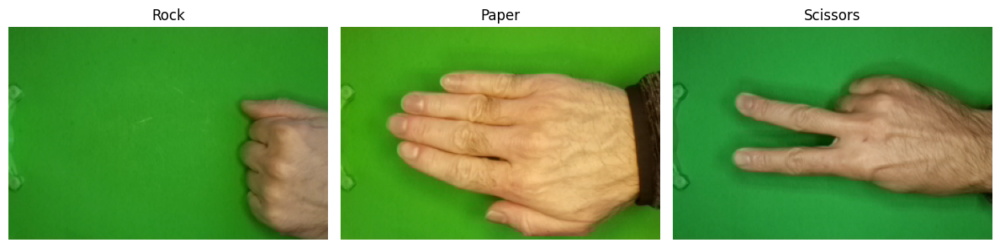

In [5]:
#Visualizing random images from each class
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

for i, label in enumerate(classes):
    class_dir = os.path.join(dataset_dir, label)
    img_name = random.choice(os.listdir(class_dir))
    img_path = os.path.join(class_dir, img_name)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(label.capitalize())
    axes[i].axis('off')

plt.tight_layout()
plt.show()

-Image resizing and normalization 

-Implementing data augumentation: rotation (of maximum 20 degrees), orizontal and vertical shifting, zoom in and out, horizontal flipping

-Splitting the images in training set (80% of images) and test set (20% of images)

In [ ]:
# Setting parameters 
img_height, img_width = 150, 150
batch_size = 32

#Augmentation parameters
train_augmenter = ImageDataGenerator(
    rescale=1./255,                    #Normalization
    validation_split=0.2,              #Split 80% / 20%
    rotation_range=20,                 #rotation (max 20 degrees)
    width_shift_range=0.1,             #horizontal shift
    height_shift_range=0.1,            #vertical shift
    zoom_range=0.2,                    #zoom in or out
    horizontal_flip=True               #horizontal flipping
)

#Test set will not be augmented but only scaled, in order to evaluate the models on the original images
test_gen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

#Training set (80% of images)
train_set = train_augmenter.flow_from_directory(
    dataset_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    seed=123,
    shuffle=True
)

#Test set (20% of images) 
test_set = test_gen.flow_from_directory(
    dataset_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    seed=123,
    shuffle=False #not shuffling test set 
)


Found 1751 images belonging to 3 classes.
Found 437 images belonging to 3 classes.


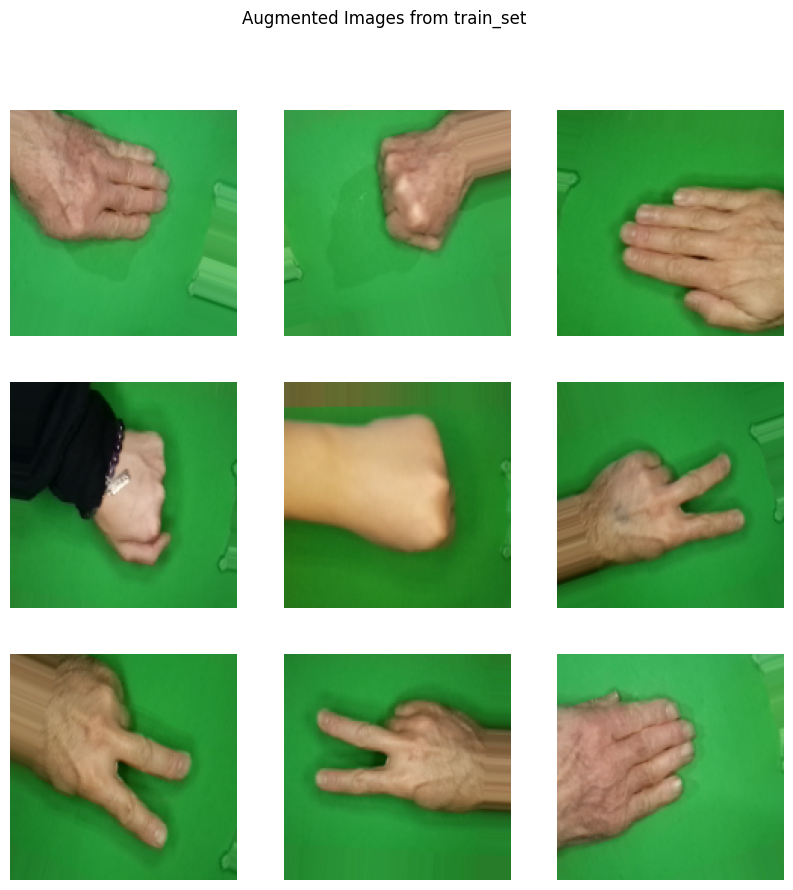

In [100]:
#Showing some augmented images from the training set
images, labels = next(train_set)  
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.axis("off")
plt.suptitle("Augmented Images from train_set")
plt.show()

2. CNN Architectures and Training
    - NN model 1:


In [ ]:
model_cnn1 = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)), 
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),  
    layers.MaxPooling2D((2, 2)),

    layers.GlobalAveragePooling2D(),

    layers.Dense(64, activation='relu'), 
    layers.Dense(3, activation='softmax')
])

In [ ]:

model_cnn1.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [15]:
model_cnn1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,747 (92.76 KB)

 Trainable params: 23,747 (92.76 KB)

 Non-trainable params: 0 (0.00 B)

Training the model: 20 epochs used for training 

In [ ]:
history_cnn1 = model_cnn1.fit(
    train_set,
    validation_data=test_set,
    epochs=20,
)

Epoch 1/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 575ms/step - accuracy: 0.3592 - loss: 1.1002 - val_accuracy: 0.4989 - val_loss: 1.0920
Epoch 2/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 30s 543ms/step - accuracy: 0.4009 - loss: 1.0795 - val_accuracy: 0.4211 - val_loss: 1.0491
Epoch 3/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 30s 538ms/step - accuracy: 0.4643 - loss: 1.0174 - val_accuracy: 0.4142 - val_loss: 1.0616
Epoch 4/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 30s 546ms/step - accuracy: 0.4569 - loss: 1.0096 - val_accuracy: 0.4233 - val_loss: 1.0054
Epoch 5/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 30s 541ms/step - accuracy: 0.4734 - loss: 1.0006 - val_accuracy: 0.5652 - val_loss: 0.9483
Epoch 6/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 30s 545ms/step - accuracy: 0.5003 - loss: 0.9741 - val_accuracy: 0.5561 - val_loss: 0.9200
Epoch 7/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 31s 569ms/step - accuracy: 0.4986 - loss: 0.9706 - val_accuracy: 0.5149 - val_loss: 0.9392
Epoch 8/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 30s 544ms/step - accuracy: 0.5191 - loss: 0.9425 - val_accu

Saving the model and the history to avoid computing it every time

In [20]:
model_cnn1.save("models/model_cnn1.keras")

In [19]:
with open("models/history_cnn1.pkl", "wb") as f:
    pickle.dump(history_cnn1.history, f)

In [17]:
loss, acc = model_cnn1.evaluate(test_set)
print("Test set Loss:", loss)
print("Test set Accuracy:", acc)

14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - accuracy: 0.8902 - loss: 0.4118
Test set Loss: 0.41178345680236816
Test set Accuracy: 0.8901602029800415


-NN Model 2

Hyperparameter tuning with cross validation have been used to choose the pest parameters for: learning rate, batch sizes and neurons

In [21]:
#Retrieving file paths and labels for the training set
filepaths = np.array(train_set.filepaths)
labels = np.array([list(train_set.class_indices.keys())[lbl] for lbl in train_set.classes])

In [ ]:
#Creating k folds in order to make a grid search for hyperparameter tuning with cross validation for more robust results
def create_stratified_folds(filepaths, labels, k=3, seed=123):
    np.random.seed(seed)
    folds = [[] for _ in range(k)]
    label_folds = [[] for _ in range(k)]

   
    for cls in np.unique(labels):
        cls_idx = np.where(labels == cls)[0]
        np.random.shuffle(cls_idx)
        cls_folds = np.array_split(cls_idx, k)
        for fold_num in range(k):
            folds[fold_num].extend(filepaths[cls_folds[fold_num]])
            label_folds[fold_num].extend(labels[cls_folds[fold_num]])
    
    return folds, label_folds

Hyperparameter tuning: grid search with cross validation, a small subset of learning rates, batch sizes and neurons have been used to search the best parameters

In [ ]:
#Hyperparameter tuning using grid search with k-fold cross validation: 
def build_cnn2(learning_rate=0.001, neurons_dense=64):
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.GlobalAveragePooling2D(),

        layers.Dense(neurons_dense, activation='relu'),
        layers.Dense(3, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


learning_rates = [0.001, 0.0005]
batch_sizes = [32, 64]
neurons_dense_list = [64, 128]
k = 3

best_acc = 0
best_params = {}
best_model = None

folds, label_folds = create_stratified_folds(filepaths, labels, k=k)
#To ensure more consistency between runs, we reduced the augmentation parameters: rotation range to 5 degrees,
# width and height shift range to 0.05, zoom range and flip removed
train_aug = ImageDataGenerator(
    rescale=1./255,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
)

val_no_aug = ImageDataGenerator(rescale=1./255)

for lr in learning_rates:
    for bs in batch_sizes:
        for neurons in neurons_dense_list:
            fold_acc = []

            for fold in range(k):
                #Validation fold
                val_files = folds[fold]
                val_labels = label_folds[fold]

                #Train fold 
                train_files_fold = []
                train_labels_fold = []
                for i in range(k):
                    if i != fold:
                        train_files_fold.extend(folds[i])
                        train_labels_fold.extend(label_folds[i])

            
                train_gen = train_aug.flow_from_dataframe(
                    pd.DataFrame({"filename": train_files_fold, "class": train_labels_fold}),
                    x_col="filename",
                    y_col="class",
                    target_size=(150, 150),
                    class_mode='categorical',
                    batch_size=bs,
                    shuffle=True
                )

                val_gen = val_no_aug.flow_from_dataframe(
                    pd.DataFrame({"filename": val_files, "class": val_labels}),
                    x_col="filename",
                    y_col="class",
                    target_size=(150, 150),
                    class_mode='categorical',
                    batch_size=bs,
                    shuffle=False
                )

                
                model = build_cnn2(learning_rate=lr, neurons_dense=neurons)
                early_stop = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True, verbose=0)

                history = model.fit(
                    train_gen,
                    validation_data=val_gen,
                    epochs=5,
                    callbacks=[early_stop],
                    verbose=1
                )

                fold_acc.append(max(history.history['val_accuracy']))

            avg_acc = np.mean(fold_acc)
            print(f"LR={lr}, BS={bs}, Neurons={neurons} → Mean Val Acc: {avg_acc:.4f}")

            if avg_acc > best_acc:
                best_acc = avg_acc
                best_params = {'lr': lr, 'batch_size': bs, 'neurons_dense': neurons}
                best_model = model

print("\nBest parameters:", best_params)
print(f"Best mean validation accuracy: {best_acc:.4f}")

Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 32s 786ms/step - accuracy: 0.3719 - loss: 1.0974 - val_accuracy: 0.5274 - val_loss: 1.0737
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 790ms/step - accuracy: 0.4559 - loss: 1.0254 - val_accuracy: 0.5445 - val_loss: 0.9519
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 30s 800ms/step - accuracy: 0.4944 - loss: 0.9870 - val_accuracy: 0.3818 - val_loss: 1.0389
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 732ms/step - accuracy: 0.5321 - loss: 0.9292 - val_accuracy: 0.5325 - val_loss: 0.8900
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 712ms/step - accuracy: 0.6024 - loss: 0.8844 - val_accuracy: 0.6678 - val_loss: 0.8418
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 28s 714ms/step - accuracy: 0.3856 - loss: 1.0701 - val_accuracy: 0.5274 - val_loss: 1.0125
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 695ms/step - accuracy: 0.4593 - loss: 1.0159 - val_accuracy: 0.4486 - val_loss: 1.0256
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 705ms/step - accuracy: 0.4636 - loss: 0.9812 - val_accuracy: 0.5291 - val_loss: 0.9462
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 697ms/step - accuracy: 0.4961 - loss: 0.9625 - val_accuracy: 0.5017 - val_loss: 0.9724
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 713ms/step - accuracy: 0.5458 - loss: 0.9314 - val_accuracy: 0.5137 - val_loss: 0.9172
Found 1168 validated image filenames belonging to 3 classes.
Found 583 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 28s 707ms/step - accuracy: 0.3938 - loss: 1.0796 - val_accuracy: 0.5763 - val_loss: 1.0314
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 729ms/step - accuracy: 0.5000 - loss: 1.0073 - val_accuracy: 0.5883 - val_loss: 0.9767
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 700ms/step - accuracy: 0.5916 - loss: 0.9500 - val_accuracy: 0.5437 - val_loss: 0.8952
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 695ms/step - accuracy: 0.6139 - loss: 0.8972 - val_accuracy: 0.6346 - val_loss: 0.8929
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 700ms/step - accuracy: 0.7072 - loss: 0.8035 - val_accuracy: 0.8473 - val_loss: 0.6674
LR=0.001, BS=32, Neurons=64 → Mean Val Acc: 0.6814
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 28s 713ms/step - accuracy: 0.3385 - loss: 1.0975 - val_accuracy: 0.3442 - val_loss: 1.0883
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 706ms/step - accuracy: 0.4490 - loss: 1.0377 - val_accuracy: 0.4281 - val_loss: 1.0222
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 698ms/step - accuracy: 0.5150 - loss: 0.9635 - val_accuracy: 0.6387 - val_loss: 0.9153
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 695ms/step - accuracy: 0.6992 - loss: 0.8083 - val_accuracy: 0.8236 - val_loss: 0.6857
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 710ms/step - accuracy: 0.7935 - loss: 0.5907 - val_accuracy: 0.8510 - val_loss: 0.4836
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 719ms/step - accuracy: 0.3685 - loss: 1.0929 - val_accuracy: 0.3682 - val_loss: 1.0662
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 705ms/step - accuracy: 0.4679 - loss: 1.0253 - val_accuracy: 0.4914 - val_loss: 0.9843
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 699ms/step - accuracy: 0.5373 - loss: 0.9742 - val_accuracy: 0.5462 - val_loss: 0.9437
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 716ms/step - accuracy: 0.5767 - loss: 0.9233 - val_accuracy: 0.5565 - val_loss: 0.8855
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 718ms/step - accuracy: 0.7301 - loss: 0.8271 - val_accuracy: 0.8476 - val_loss: 0.6652
Found 1168 validated image filenames belonging to 3 classes.
Found 583 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 32s 791ms/step - accuracy: 0.3570 - loss: 1.0966 - val_accuracy: 0.4408 - val_loss: 1.0762
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 707ms/step - accuracy: 0.4829 - loss: 1.0087 - val_accuracy: 0.4288 - val_loss: 1.0178
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 698ms/step - accuracy: 0.5351 - loss: 0.9674 - val_accuracy: 0.6449 - val_loss: 0.9134
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 702ms/step - accuracy: 0.5959 - loss: 0.9179 - val_accuracy: 0.4700 - val_loss: 0.9354
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 707ms/step - accuracy: 0.6935 - loss: 0.8567 - val_accuracy: 0.6878 - val_loss: 0.7697
LR=0.001, BS=32, Neurons=128 → Mean Val Acc: 0.7955
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.3676 - loss: 1.0896 - val_accuracy: 0.3887 - val_loss: 1.0634
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4524 - loss: 1.0297 - val_accuracy: 0.4469 - val_loss: 1.0076
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5047 - loss: 0.9691 - val_accuracy: 0.5188 - val_loss: 0.9683
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5330 - loss: 0.9379 - val_accuracy: 0.4623 - val_loss: 0.9762
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.6058 - loss: 0.9334 - val_accuracy: 0.5634 - val_loss: 1.0124
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.3445 - loss: 1.0946 - val_accuracy: 0.6592 - val_loss: 1.0760
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.4713 - loss: 1.0479 - val_accuracy: 0.3716 - val_loss: 1.0589
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.4456 - loss: 1.0190 - val_accuracy: 0.4623 - val_loss: 0.9954
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.5373 - loss: 0.9660 - val_accuracy: 0.5428 - val_loss: 0.9250
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.5476 - loss: 0.9295 - val_accuracy: 0.4315 - val_loss: 0.9777
Found 1168 validated image filenames belonging to 3 classes.
Found 583 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.3622 - loss: 1.0993 - val_accuracy: 0.3997 - val_loss: 1.0893
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4118 - loss: 1.0736 - val_accuracy: 0.4237 - val_loss: 1.0393
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5051 - loss: 1.0133 - val_accuracy: 0.4957 - val_loss: 1.0102
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4760 - loss: 1.0027 - val_accuracy: 0.4923 - val_loss: 0.9722
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5351 - loss: 0.9678 - val_accuracy: 0.5043 - val_loss: 0.9515
LR=0.001, BS=64, Neurons=64 → Mean Val Acc: 0.5756
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.3659 - loss: 1.0946 - val_accuracy: 0.3459 - val_loss: 1.0840
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.3976 - loss: 1.0632 - val_accuracy: 0.4709 - val_loss: 1.0273
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4910 - loss: 0.9923 - val_accuracy: 0.5257 - val_loss: 0.9596
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.4927 - loss: 0.9800 - val_accuracy: 0.6558 - val_loss: 0.9515
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5124 - loss: 0.9645 - val_accuracy: 0.5086 - val_loss: 0.9511
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.3719 - loss: 1.0909 - val_accuracy: 0.4178 - val_loss: 1.0697
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4165 - loss: 1.0680 - val_accuracy: 0.5051 - val_loss: 1.0403
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4602 - loss: 1.0309 - val_accuracy: 0.4589 - val_loss: 0.9996
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4619 - loss: 0.9999 - val_accuracy: 0.4983 - val_loss: 0.9670
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5630 - loss: 0.9594 - val_accuracy: 0.7038 - val_loss: 0.9107
Found 1168 validated image filenames belonging to 3 classes.
Found 583 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.3673 - loss: 1.0913 - val_accuracy: 0.3842 - val_loss: 1.0719
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.4555 - loss: 1.0465 - val_accuracy: 0.4683 - val_loss: 1.0113
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.4512 - loss: 1.0083 - val_accuracy: 0.5060 - val_loss: 0.9669
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5043 - loss: 0.9692 - val_accuracy: 0.5077 - val_loss: 0.9800
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5591 - loss: 0.9499 - val_accuracy: 0.5300 - val_loss: 0.9465
LR=0.001, BS=64, Neurons=128 → Mean Val Acc: 0.6299
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 719ms/step - accuracy: 0.3933 - loss: 1.0909 - val_accuracy: 0.5017 - val_loss: 1.0731
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 706ms/step - accuracy: 0.4773 - loss: 1.0323 - val_accuracy: 0.3938 - val_loss: 1.0383
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 718ms/step - accuracy: 0.5039 - loss: 0.9710 - val_accuracy: 0.4092 - val_loss: 1.0512
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 717ms/step - accuracy: 0.5261 - loss: 0.9513 - val_accuracy: 0.5137 - val_loss: 0.9732
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 709ms/step - accuracy: 0.5887 - loss: 0.9266 - val_accuracy: 0.6027 - val_loss: 0.9111
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 719ms/step - accuracy: 0.3676 - loss: 1.0910 - val_accuracy: 0.4418 - val_loss: 1.0692
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 732ms/step - accuracy: 0.4696 - loss: 1.0493 - val_accuracy: 0.5068 - val_loss: 1.0097
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 713ms/step - accuracy: 0.5039 - loss: 0.9876 - val_accuracy: 0.3784 - val_loss: 1.0164
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 717ms/step - accuracy: 0.5253 - loss: 0.9804 - val_accuracy: 0.5668 - val_loss: 0.9367
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 728ms/step - accuracy: 0.5793 - loss: 0.9409 - val_accuracy: 0.5942 - val_loss: 0.9035
Found 1168 validated image filenames belonging to 3 classes.
Found 583 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 735ms/step - accuracy: 0.3545 - loss: 1.0961 - val_accuracy: 0.3808 - val_loss: 1.0848
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 26s 712ms/step - accuracy: 0.4289 - loss: 1.0705 - val_accuracy: 0.4889 - val_loss: 1.0262
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 717ms/step - accuracy: 0.5197 - loss: 0.9793 - val_accuracy: 0.5111 - val_loss: 0.9771
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 770ms/step - accuracy: 0.5574 - loss: 0.9702 - val_accuracy: 0.7427 - val_loss: 0.9072
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 719ms/step - accuracy: 0.7003 - loss: 0.9003 - val_accuracy: 0.7256 - val_loss: 0.8465
LR=0.0005, BS=32, Neurons=64 → Mean Val Acc: 0.6465
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 30s 737ms/step - accuracy: 0.3556 - loss: 1.0950 - val_accuracy: 0.3510 - val_loss: 1.0842
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 733ms/step - accuracy: 0.3959 - loss: 1.0763 - val_accuracy: 0.4538 - val_loss: 1.0455
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 738ms/step - accuracy: 0.4893 - loss: 1.0092 - val_accuracy: 0.4949 - val_loss: 0.9769
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 770ms/step - accuracy: 0.4987 - loss: 0.9683 - val_accuracy: 0.5171 - val_loss: 0.9469
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 767ms/step - accuracy: 0.5656 - loss: 0.9407 - val_accuracy: 0.6164 - val_loss: 0.9283
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 30s 748ms/step - accuracy: 0.4027 - loss: 1.0881 - val_accuracy: 0.5137 - val_loss: 1.0559
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 28s 761ms/step - accuracy: 0.4576 - loss: 1.0171 - val_accuracy: 0.5205 - val_loss: 0.9669
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 734ms/step - accuracy: 0.4644 - loss: 0.9872 - val_accuracy: 0.5171 - val_loss: 0.9459
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 28s 741ms/step - accuracy: 0.4936 - loss: 0.9790 - val_accuracy: 0.5360 - val_loss: 1.0034
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 28s 742ms/step - accuracy: 0.5750 - loss: 0.9426 - val_accuracy: 0.6301 - val_loss: 0.9041
Found 1168 validated image filenames belonging to 3 classes.
Found 583 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 29s 743ms/step - accuracy: 0.3613 - loss: 1.0934 - val_accuracy: 0.3310 - val_loss: 1.1038
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 28s 755ms/step - accuracy: 0.3716 - loss: 1.0838 - val_accuracy: 0.3756 - val_loss: 1.0724
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 28s 740ms/step - accuracy: 0.4863 - loss: 1.0283 - val_accuracy: 0.4940 - val_loss: 0.9696
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 728ms/step - accuracy: 0.5574 - loss: 0.9468 - val_accuracy: 0.5918 - val_loss: 0.9182
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 27s 726ms/step - accuracy: 0.6455 - loss: 0.9030 - val_accuracy: 0.7616 - val_loss: 0.8277
LR=0.0005, BS=32, Neurons=128 → Mean Val Acc: 0.6694
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.4113 - loss: 1.0845 - val_accuracy: 0.3904 - val_loss: 1.0655
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4704 - loss: 1.0379 - val_accuracy: 0.4555 - val_loss: 1.0103
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5039 - loss: 0.9827 - val_accuracy: 0.5120 - val_loss: 0.9575
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5270 - loss: 0.9469 - val_accuracy: 0.4743 - val_loss: 0.9831
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.5313 - loss: 0.9449 - val_accuracy: 0.5137 - val_loss: 0.9461
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.4276 - loss: 1.0953 - val_accuracy: 0.3990 - val_loss: 1.0842
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4225 - loss: 1.0718 - val_accuracy: 0.4075 - val_loss: 1.0527
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4593 - loss: 1.0296 - val_accuracy: 0.4760 - val_loss: 0.9912
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5287 - loss: 0.9654 - val_accuracy: 0.5497 - val_loss: 0.9475
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5270 - loss: 0.9534 - val_accuracy: 0.5377 - val_loss: 0.9355
Found 1168 validated image filenames belonging to 3 classes.
Found 583 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.3553 - loss: 1.0992 - val_accuracy: 0.5352 - val_loss: 1.0907
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4598 - loss: 1.0852 - val_accuracy: 0.5129 - val_loss: 1.0692
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4315 - loss: 1.0547 - val_accuracy: 0.4700 - val_loss: 1.0318
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5111 - loss: 0.9975 - val_accuracy: 0.5111 - val_loss: 0.9707
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5214 - loss: 0.9635 - val_accuracy: 0.5026 - val_loss: 0.9406
LR=0.0005, BS=64, Neurons=64 → Mean Val Acc: 0.5328
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.3890 - loss: 1.0956 - val_accuracy: 0.3339 - val_loss: 1.0935
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.4113 - loss: 1.0873 - val_accuracy: 0.4469 - val_loss: 1.0686
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4919 - loss: 1.0443 - val_accuracy: 0.4812 - val_loss: 1.0069
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4670 - loss: 0.9862 - val_accuracy: 0.5103 - val_loss: 0.9590
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5064 - loss: 0.9538 - val_accuracy: 0.4897 - val_loss: 0.9596
Found 1167 validated image filenames belonging to 3 classes.
Found 584 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.3393 - loss: 1.0990 - val_accuracy: 0.3253 - val_loss: 1.0919
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.3659 - loss: 1.0860 - val_accuracy: 0.4623 - val_loss: 1.0740
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4593 - loss: 1.0528 - val_accuracy: 0.4726 - val_loss: 1.0204
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4859 - loss: 1.0013 - val_accuracy: 0.5582 - val_loss: 0.9681
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5356 - loss: 0.9581 - val_accuracy: 0.5274 - val_loss: 0.9384
Found 1168 validated image filenames belonging to 3 classes.
Found 583 validated image filenames belonging to 3 classes.


c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.3313 - loss: 1.0962 - val_accuracy: 0.3533 - val_loss: 1.0886
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4375 - loss: 1.0812 - val_accuracy: 0.4597 - val_loss: 1.0621
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4281 - loss: 1.0494 - val_accuracy: 0.5129 - val_loss: 1.0083
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4606 - loss: 1.0149 - val_accuracy: 0.5026 - val_loss: 0.9833
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5557 - loss: 0.9678 - val_accuracy: 0.5780 - val_loss: 0.9198
LR=0.0005, BS=64, Neurons=128 → Mean Val Acc: 0.5488

Best parameters: {'lr': 0.001, 'batch_size': 32, 'neurons_dense': 128}
Best mean validation accuracy: 0.7955


Training the model with the hyperparameters found with a higher number of epochs and using the full training set 
The maximum number of epochs is set at 20 but an early stopping have been added

In [ ]:
#The hyperparameters found are:
# - Learning Rate: 0.001
# - Batch Size: 32
# - Neurons in Dense Layer: 128

model_cnn2 = build_cnn2(
    learning_rate=best_params['lr'],
    neurons_dense=best_params['neurons_dense']
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

history_cnn2 = model_cnn2.fit(
    train_set,                              #we already have a batch size of 32 so we don't need another generator
    validation_data=test_set,
    epochs=20,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 38s 656ms/step - accuracy: 0.4255 - loss: 1.0706 - val_accuracy: 0.5263 - val_loss: 0.9781
Epoch 2/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 39s 704ms/step - accuracy: 0.5128 - loss: 1.0126 - val_accuracy: 0.7803 - val_loss: 0.9599
Epoch 3/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 40s 720ms/step - accuracy: 0.6265 - loss: 0.9174 - val_accuracy: 0.7140 - val_loss: 0.7802
Epoch 4/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 40s 732ms/step - accuracy: 0.7282 - loss: 0.7057 - val_accuracy: 0.8146 - val_loss: 0.5106
Epoch 5/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 39s 708ms/step - accuracy: 0.7676 - loss: 0.5611 - val_accuracy: 0.8009 - val_loss: 0.5097
Epoch 6/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 37s 676ms/step - accuracy: 0.7921 - loss: 0.5231 - val_accuracy: 0.8398 - val_loss: 0.4195
Epoch 7/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 39s 700ms/step - accuracy: 0.8047 - loss: 0.4905 - val_accuracy: 0.7986 - val_loss: 0.4575
Epoch 8/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 37s 673ms/step - accuracy: 0.7927 - loss: 0.5041 - val_accu

In [83]:
model_cnn2.summary()

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_76 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_76 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_77 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_77 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_78 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_78 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_26     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 330,443 (1.26 MB)

 Trainable params: 110,147 (430.26 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 220,296 (860.54 KB)

In [28]:
model_cnn2.save("models/model_cnn2.keras")

In [ ]:
#savingn the history
with open("models/history_cnn2.pkl", "wb") as f:
    pickle.dump(history_cnn2.history, f)

In [26]:
loss, acc = model_cnn2.evaluate(test_set)
print("Test set Loss:", loss)
print("Test set Accuracy:", acc)

14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - accuracy: 0.9725 - loss: 0.0716
Test set Loss: 0.07164956629276276
Test set Accuracy: 0.972540020942688


-NN Model 3

In [46]:
#Since the model is more complex, it is better to use a bigger batch size, in order to avoid noise during the training
#and get a more precise estimate of the gradients

batch_size_cnn3 = 64

#Augmentation for CNN_3
train_augmenter_cnn3 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_gen_cnn3 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

#Training set for CNN_3
train_set_cnn3 = train_augmenter_cnn3.flow_from_directory(
    dataset_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size_cnn3,
    class_mode='categorical',
    subset='training',
    seed=123,       #keep the same seed for reproducibility
    shuffle=True
)

#Test set fort CNN_3
test_set_cnn3 = test_gen_cnn3.flow_from_directory(
    dataset_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size_cnn3,
    class_mode='categorical',
    subset='validation',
    seed=123,       
    shuffle=False
)

Found 1751 images belonging to 3 classes.
Found 437 images belonging to 3 classes.


In [109]:
#adding one convolutional layer and one max pooling layer with a dropout layer to prevent overfitting
model_cnn3 = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.GlobalAveragePooling2D(),

    layers.Dense(128, activation='relu'),
    #layers.BatchNormalization(),       #it is also possible to add batch normalization here
    layers.Dropout(0.5),               #preventing overfitting
    layers.Dense(3, activation='softmax')
])

#compiling the model
model_cnn3.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

early_st = EarlyStopping(
    monitor='val_loss',
    patience=3,             
    restore_best_weights=True,
    verbose=1
)

history_cnn3 = model_cnn3.fit(
    train_set_cnn3,
    epochs=20,
    validation_data=test_set_cnn3,
    callbacks=[early_st]
)

Epoch 1/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.3507 - loss: 1.0986 - val_accuracy: 0.3432 - val_loss: 1.0924
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.4386 - loss: 1.0686 - val_accuracy: 0.3501 - val_loss: 1.0536
Epoch 3/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.5528 - loss: 0.9577 - val_accuracy: 0.6728 - val_loss: 0.7860
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.6922 - loss: 0.7617 - val_accuracy: 0.8535 - val_loss: 0.5374
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - accuracy: 0.7693 - loss: 0.5674 - val_accuracy: 0.8696 - val_loss: 0.3830
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.7950 - loss: 0.5092 - val_accuracy: 0.8741 - val_loss: 0.3685
Epoch 7/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.7944 - loss: 0.4963 - val_accuracy: 0.8879 - val_loss: 0.3283
Epoch 8/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.8041 - loss: 0.4688 - val_accuracy: 0.8535 - val_loss:

In [110]:
loss, acc = model_cnn3.evaluate(test_set)
print("Test set Loss:", loss)
print("Test set Accuracy:", acc)

14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - accuracy: 0.9817 - loss: 0.0531
Test set Loss: 0.053149621933698654
Test set Accuracy: 0.9816933870315552


In [111]:
model_cnn3.save("models/model_cnn3.keras")

In [112]:
with open("models/history_cnn3.pkl", "wb") as f:
    pickle.dump(history_cnn3.history, f)

In [113]:
model_cnn3.summary()

Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_163 (Conv2D)             │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_163               │ (None, 74, 74, 32)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_164 (Conv2D)             │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_164               │ (None, 36, 36, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_165 (Conv2D)             │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_165               │ (None, 17, 17, 128)    │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_166 (Conv2D)             │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_166               │ (None, 7, 7, 256)      │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_53     │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,265,099 (4.83 MB)

 Trainable params: 421,699 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 843,400 (3.22 MB)

3. Evaluation and Analysis

In [114]:
#Defining a function to evaluate all the models
def evaluate_model(model, test_set, model_name="Model"):
    
    y_pred_probs = model.predict(test_set)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = test_set.classes

    # Metriche
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='macro')
    rec = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    
    return {
        "Model": model_name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1-score": f1
    }

In [115]:
results = []
results.append(evaluate_model(model_cnn1, test_set, "CNN_1"))
results.append(evaluate_model(model_cnn2, test_set, "CNN_2"))
results.append(evaluate_model(model_cnn3, test_set, "CNN_3"))

14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step


In [116]:
df_results = pd.DataFrame(results)
print(df_results)

   Model  Accuracy  Precision    Recall  F1-score
0  CNN_1  0.890160   0.892091  0.890641  0.890226
1  CNN_2  0.972540   0.973090  0.972506  0.972519
2  CNN_3  0.981693   0.981999  0.981596  0.981633


In [117]:
y_pred_probs_cnn1 = model_cnn1.predict(test_set)
y_pred_cnn1 = np.argmax(y_pred_probs_cnn1, axis=1)
y_true_cnn1 = test_set.classes

# Confusion matrix
cm_cnn1 = confusion_matrix(y_true_cnn1, y_pred_cnn1)
print("Confusion Matrix CNN1:\n", cm_cnn1)

14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step
Confusion Matrix CNN1:
 [[126   7   9]
 [  9 136   0]
 [ 18   5 127]]


In [118]:
y_pred_probs_cnn2 = model_cnn2.predict(test_set)
y_pred_cnn2 = np.argmax(y_pred_probs_cnn2, axis=1)
y_true_cnn2 = test_set.classes

#Confusion matrix
cm_cnn2 = confusion_matrix(y_true_cnn2, y_pred_cnn2)
print("Confusion Matrix CNN2:\n", cm_cnn2)

14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step
Confusion Matrix CNN2:
 [[136   4   2]
 [  1 144   0]
 [  1   4 145]]


In [119]:
#Since we have softmax in the last layer we get an array of probabilities for each class
#we need then to convert them to class labels
y_pred_probs_cnn3 = model_cnn3.predict(test_set)
y_pred_cnn3 = np.argmax(y_pred_probs_cnn3, axis=1)
y_true_cnn3 = test_set.classes
cm_cnn3 = confusion_matrix(y_true_cnn3, y_pred_cnn3)
print("Confusion Matrix CNN3:\n", cm_cnn3)

14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 215ms/step
Confusion Matrix CNN3:
 [[137   3   2]
 [  0 145   0]
 [  1   2 147]]


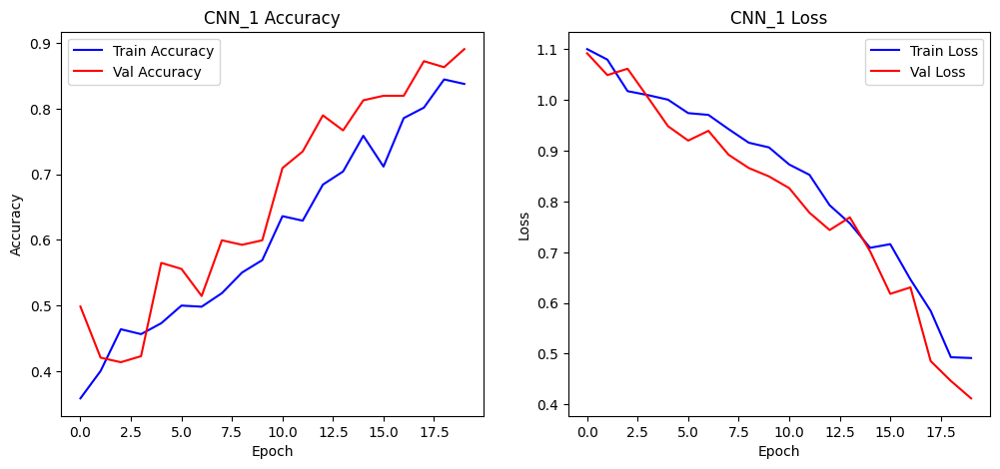

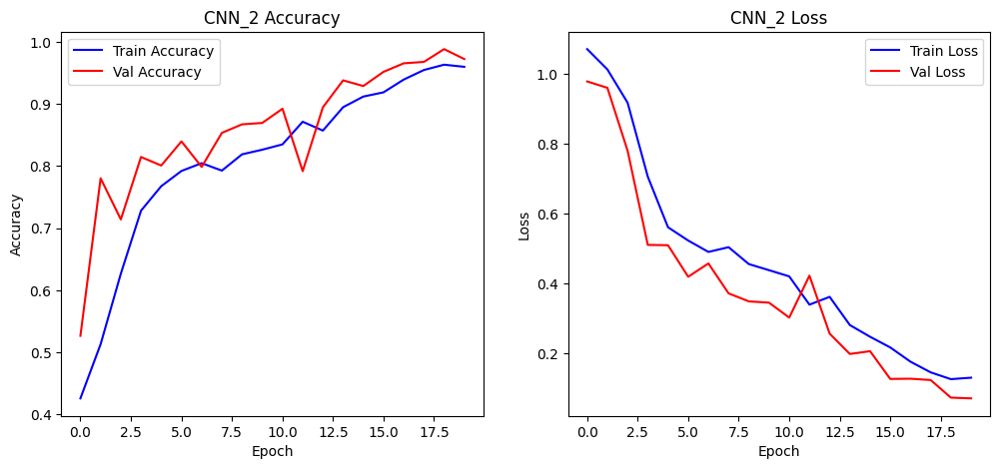

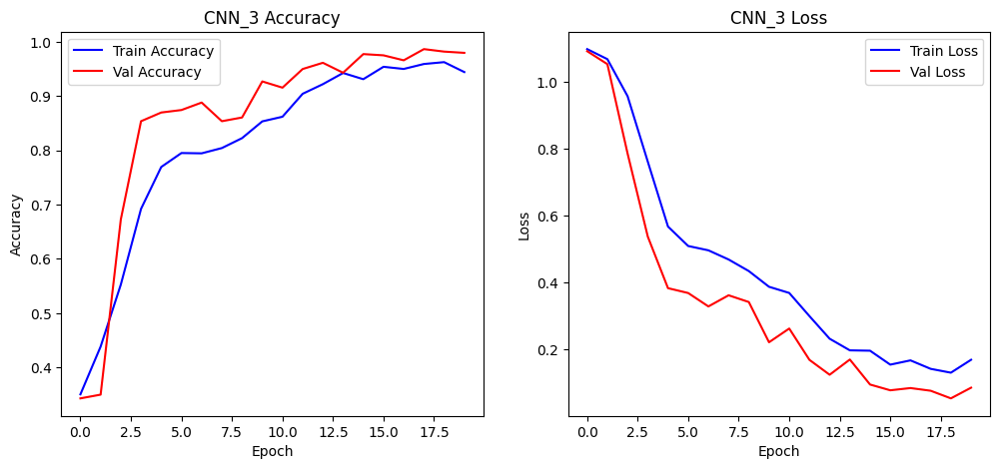

In [120]:
def plot_training_curves(history, model_name="Model"):
    if hasattr(history, 'history'):
        history = history.history
    
    plt.figure(figsize=(12,5))
    
    # Accuracy
    plt.subplot(1,2,1)
    plt.plot(history['accuracy'], label='Train Accuracy', color='blue')
    plt.plot(history['val_accuracy'], label='Val Accuracy', color='red')
    plt.title(f'{model_name} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Loss
    plt.subplot(1,2,2)
    plt.plot(history['loss'], label='Train Loss', color='blue')
    plt.plot(history['val_loss'], label='Val Loss', color='red')
    plt.title(f'{model_name} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.show()

#Change history_cnn1, history_cnn2, history_cnn3 with history_cnn1_loaded, history_cnn2_loaded, history_cnn3_loaded if you loaded the histories from file
plot_training_curves(history_cnn1, "CNN_1")
plot_training_curves(history_cnn2, "CNN_2")
plot_training_curves(history_cnn3, "CNN_3")

Now we can do an analysis on the misclassified image, to see what are the most common type of errors the neural networks tendt to do

In [33]:
def misclassification_analysis(model, test_set, model_name="Model", num_examples=9, randomize=True):
    #Predictions
    y_pred_probs = model.predict(test_set, steps=len(test_set), verbose=1)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = test_set.classes
    class_labels = list(test_set.class_indices.keys())

    #Indexes of missclassified examples
    mis_idx = np.where(y_pred != y_true)[0]
    print(f"\n{model_name} - Missclassified images: {len(mis_idx)}")

    #Error table
    if len(mis_idx) > 0:
        df_errors = pd.crosstab(
            pd.Series([class_labels[i] for i in y_true[mis_idx]], name="True"),
            pd.Series([class_labels[i] for i in y_pred[mis_idx]], name="Predicted"),
            dropna=False
        )
    else:
        df_errors = pd.DataFrame(0, index=class_labels, columns=class_labels)

    print(f"\n{model_name} - Errors table:\n")
    print(df_errors)

    #Visualizing some misclassified examples
    if len(mis_idx) > 0:
        if randomize:
            np.random.shuffle(mis_idx)  

        cols = min(num_examples, 3)
        rows = int(np.ceil(min(num_examples, len(mis_idx)) / cols))
        plt.figure(figsize=(5*cols, 4*rows))
        for k, idx in enumerate(mis_idx[:num_examples]):
            img_path = test_set.filepaths[idx]
            img = plt.imread(img_path)

            true_lbl = class_labels[y_true[idx]]
            pred_lbl = class_labels[y_pred[idx]]
            conf = float(np.max(y_pred_probs[idx]))

            ax = plt.subplot(rows, cols, k+1)
            ax.imshow(img)
            ax.set_title(f"T: {true_lbl}\nP: {pred_lbl}", color="red")
            ax.axis("off")

        plt.suptitle(f"{model_name} - Misclassified examples", fontsize=14)
        plt.tight_layout()
        plt.show()

    return df_errors


14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step

CNN_1 - Missclassified images: 48

CNN_1 - Errors table:

Predicted  paper  rock  scissors
True                            
paper          0     7         9
rock           9     0         0
scissors      18     5         0


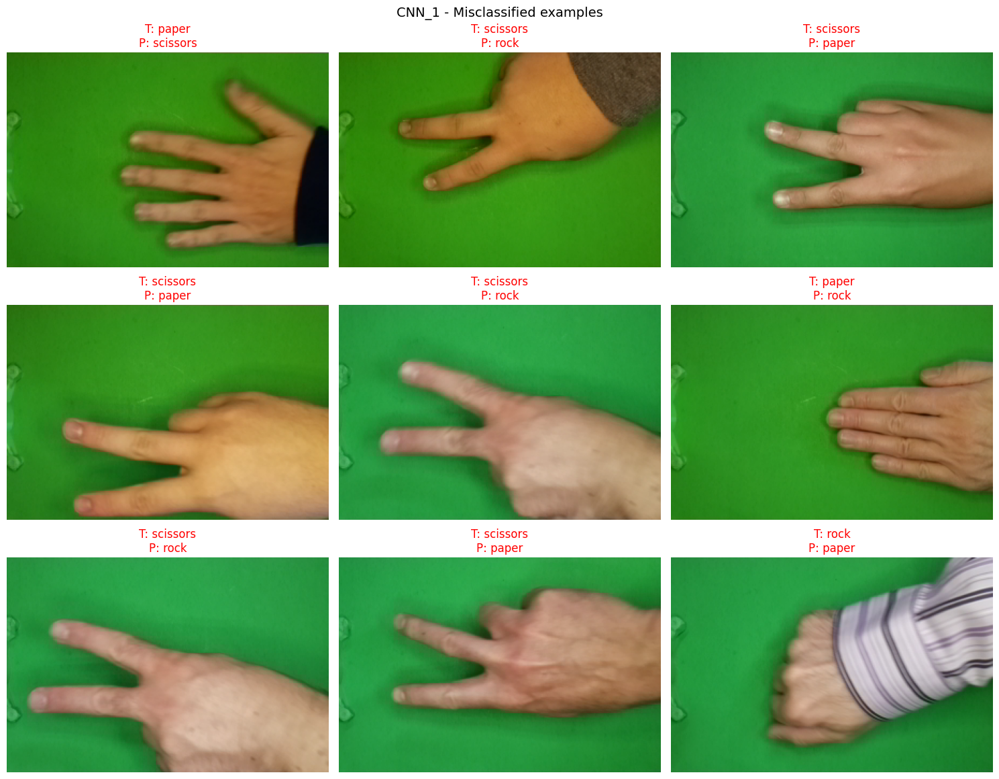

14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step

CNN_2 - Missclassified images: 12

CNN_2 - Errors table:

Predicted  paper  rock  scissors
True                            
paper          0     4         2
rock           1     0         0
scissors       1     4         0


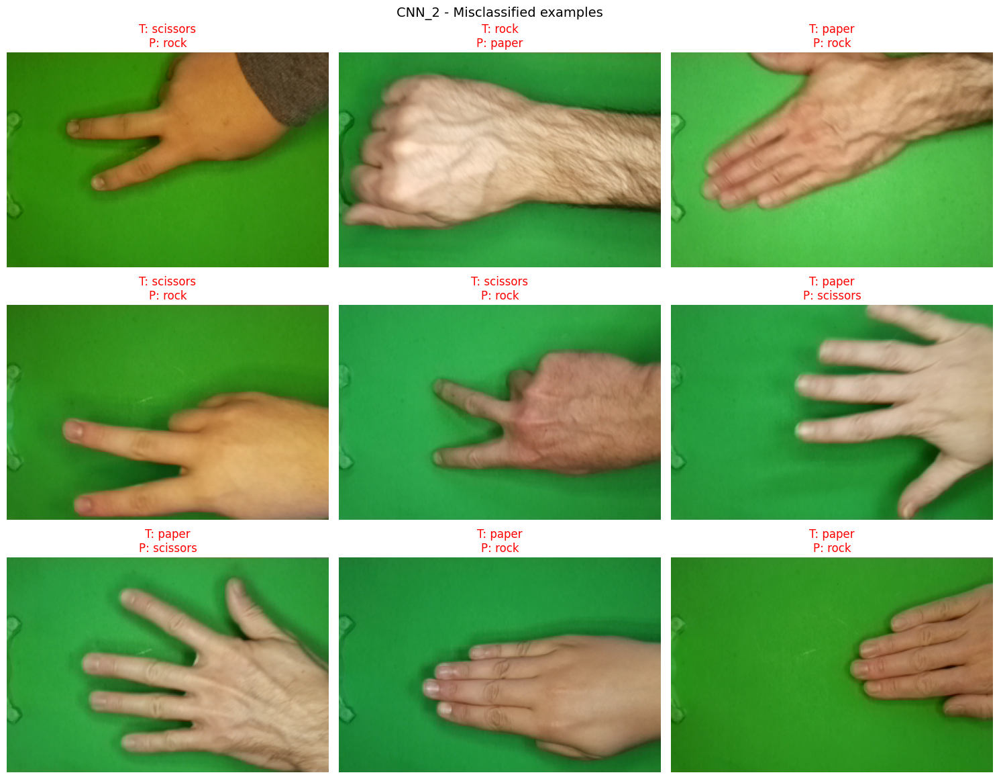

7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 417ms/step

CNN_3 - Missclassified images: 8

CNN_3 - Errors table:

Predicted  paper  rock  scissors
True                            
paper          0     3         2
scissors       1     2         0


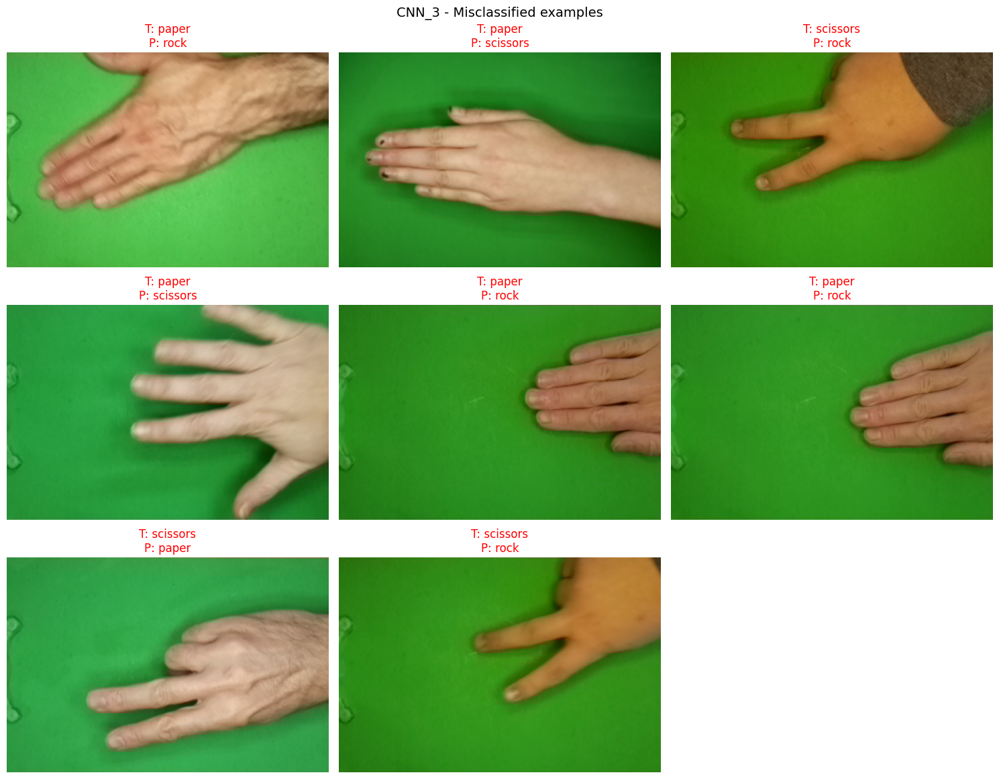

In [125]:
errors_cnn1 = misclassification_analysis(model_cnn1, test_set, "CNN_1", num_examples=9)
errors_cnn2 = misclassification_analysis(model_cnn2, test_set, "CNN_2", num_examples=9)
errors_cnn3 = misclassification_analysis(model_cnn3, test_set_cnn3, "CNN_3", num_examples=9)

4. Evaluating the model with personal data

In [ ]:
#rotating the images in the dataset by 90 degrees to the left to make them consistent
#with the orientation of the images in the training set

for class_name in ["paper", "rock", "scissors"]:
    class_folder = os.path.join(dataset_path, class_name)
    for fname in os.listdir(class_folder):
        img_path = os.path.join(class_folder, fname)
        img = Image.open(img_path)
        img = img.rotate(90, expand=True)  # ruota 90° a sinistra
        img.save(img_path)

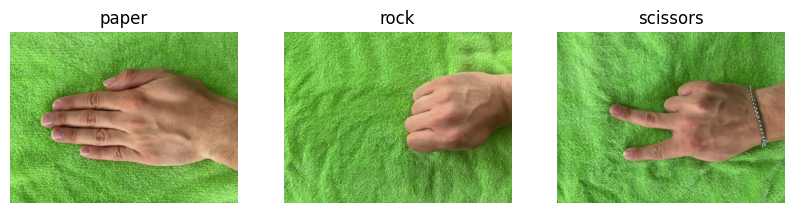

In [ ]:
#showing some images from the dataset after rotation
classes = ["paper", "rock", "scissors"]
plt.figure(figsize=(10, 5))
for i, class_name in enumerate(classes):
    class_folder = os.path.join(dataset_path, class_name)
    img_name = os.listdir(class_folder)[0]
    img_path = os.path.join(class_folder, img_name)
    img = Image.open(img_path)
    
    plt.subplot(1, 3, i+1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis('off')

plt.show()

In [ ]:
#reshaping and normalizing the images
img_height, img_width = 150, 150
batch_size = 32

test_gen = ImageDataGenerator(rescale=1./255)

dataset_path = "personal dataset"

personal_dataset = test_gen.flow_from_directory(
    dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  
)

Found 100 images belonging to 3 classes.


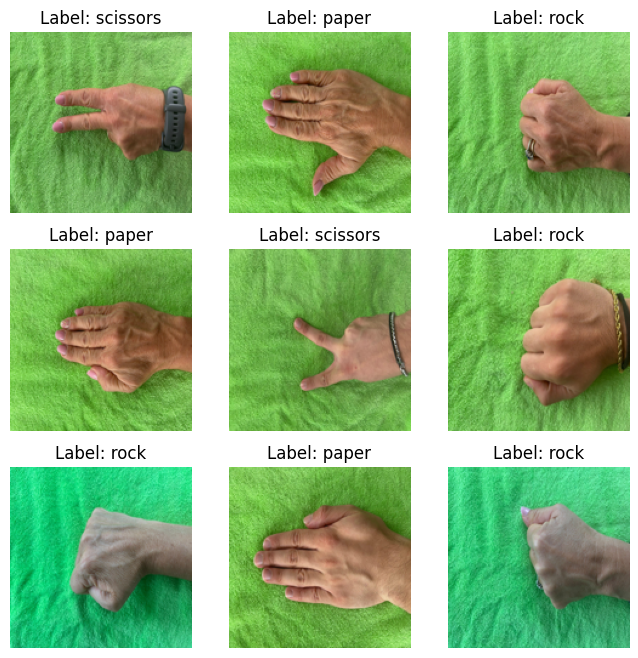

In [ ]:
#plotting some images after the preprocessing
num_images = 9
random_indices = np.random.choice(len(personal_dataset.filepaths), size=num_images, replace=False)
plt.figure(figsize=(8, 8))
class_labels = list(personal_dataset.class_indices.keys())

for i, idx in enumerate(random_indices):
    img = Image.open(personal_dataset.filepaths[idx]).resize((img_height, img_width))
    img_array = np.array(img) / 255.0  

    label_idx = personal_dataset.classes[idx]
    label = class_labels[label_idx]

    plt.subplot(3, 3, i+1)
    plt.imshow(img_array)
    plt.title(f"Label: {label}")
    plt.axis('off')

plt.show()

In [ ]:
#computing loss and accuracy for each model on the personal dataset
loss1, acc1 = model_cnn1.evaluate(personal_dataset, verbose=1)
loss2, acc2 = model_cnn2.evaluate(personal_dataset, verbose=1)
loss3, acc3 = model_cnn3.evaluate(personal_dataset, verbose=1)

print(f"CNN1 Accuracy: {acc1*100:.2f}%")
print(f"CNN2 Accuracy: {acc2*100:.2f}%")
print(f"CNN3 Accuracy: {acc3*100:.2f}%")

c:\Users\marco\anaconda3\envs\ml_project\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 495ms/step - accuracy: 0.5700 - loss: 0.9052
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 508ms/step - accuracy: 0.6200 - loss: 2.0876
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 522ms/step - accuracy: 0.8000 - loss: 0.5060
CNN1 Accuracy: 57.00%
CNN2 Accuracy: 62.00%
CNN3 Accuracy: 80.00%


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 533ms/step

CNN_1 - Missclassified images: 43

CNN_1 - Errors table:

Predicted  paper  scissors
True                      
rock          19         9
scissors      15         0


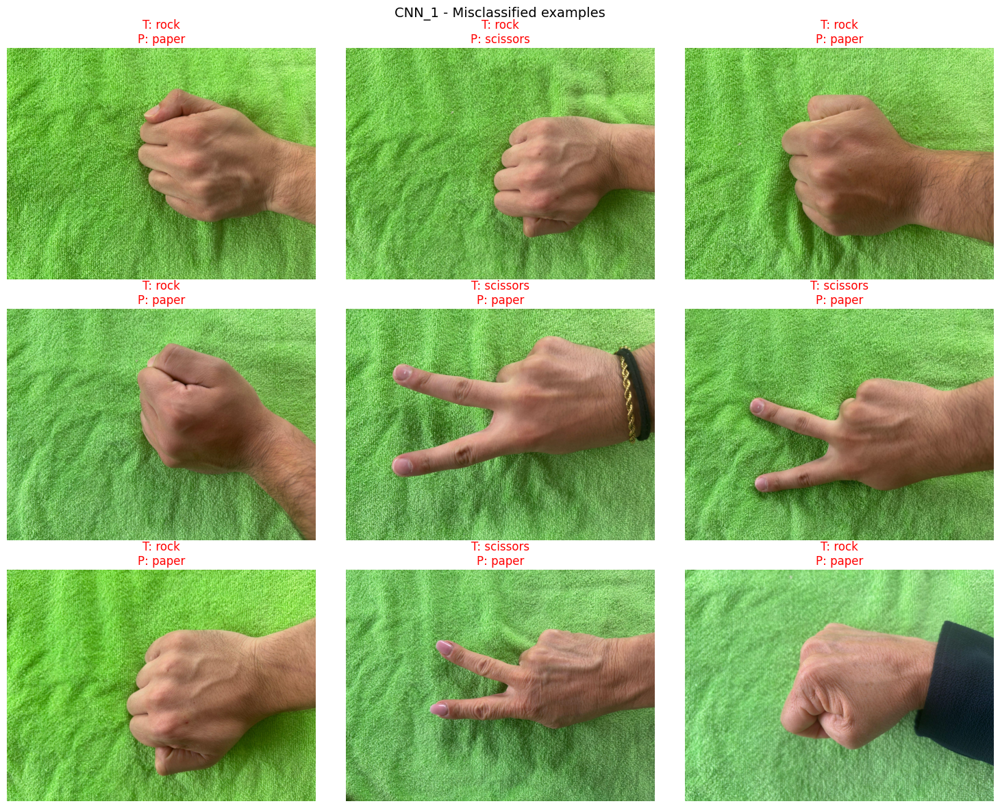

4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 603ms/step

CNN_2 - Missclassified images: 38

CNN_2 - Errors table:

Predicted  paper  rock
True                  
paper          0     6
scissors       3    29


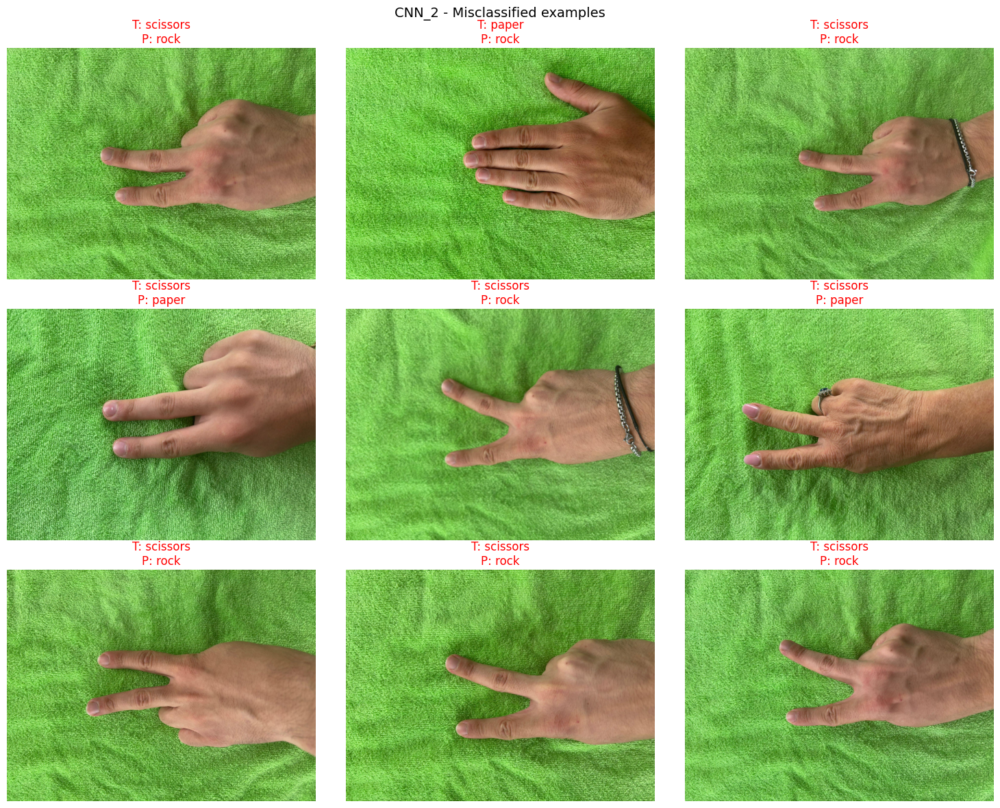

4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 579ms/step

CNN_3 - Missclassified images: 20

CNN_3 - Errors table:

Predicted  paper  rock  scissors
True                            
paper          0     2         1
rock           6     0         0
scissors       1    10         0


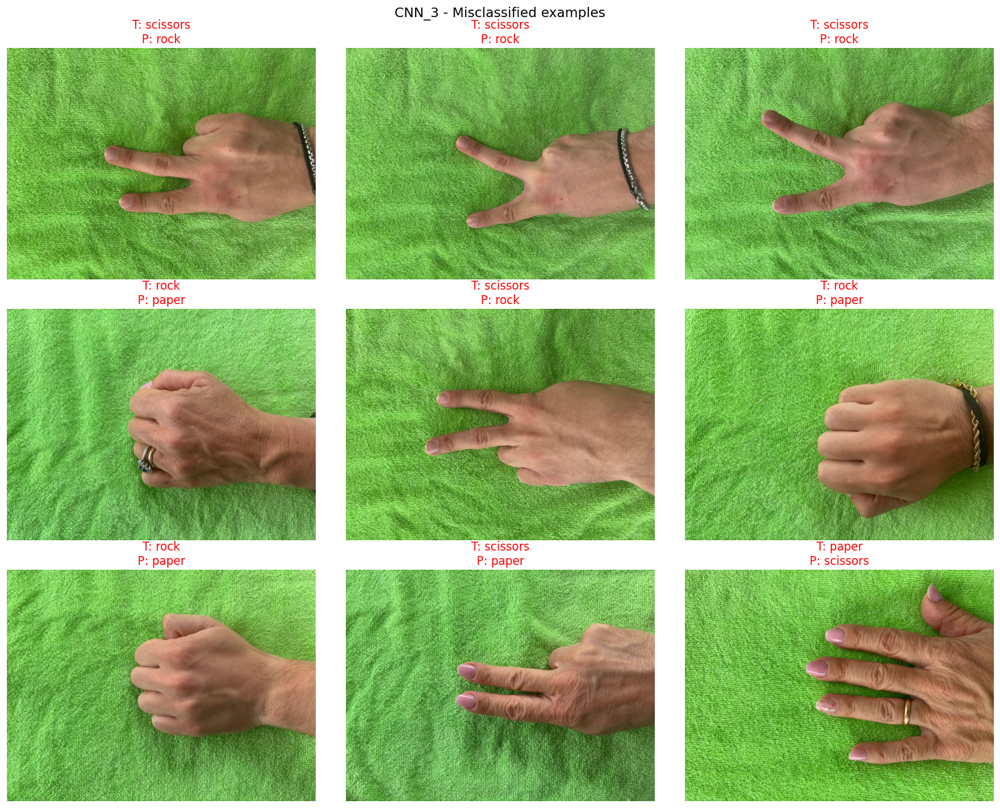

In [ ]:
#showing the misclassified examples on the personal dataset
errors_cnn1_personal = misclassification_analysis(model_cnn1, personal_dataset, "CNN_1", num_examples=9)
errors_cnn2_personal = misclassification_analysis(model_cnn2, personal_dataset, "CNN_2", num_examples=9)
errors_cnn3_personal = misclassification_analysis(model_cnn3, personal_dataset, "CNN_3", num_examples=9)